# Louvain clustering of Allen MERFISH data with iterative resolution

## Import modules

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import bbknn
import anndata
import seaborn as sb
import matplotlib.pyplot as plt

sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=100)

/anaconda3/lib/python3.6/site-packages/anndata/core/anndata.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


scanpy==1.4.5.2.dev6+gbb70446 anndata==0.6.22.post1 umap==0.3.10 numpy==1.18.1 scipy==1.4.1 pandas==1.0.1 scikit-learn==0.22.1 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


## Read data

In [2]:
## MERFISH count data normalized by area
merFISH_Areadata = sc.read('/Users/zhangy/Documents/CZI-2018/SpaceJam/spaceJam-2020/data/Brian/MERFISH_Allen_by_area.csv', 
                           delimiter=",", first_column_names=True)

## MERFISH spatial coordinates
coordinates = pd.read_csv("./coord.csv", index_col = 0)
merFISH_Areadata.obsm["X_spatial"] = coordinates.to_numpy()

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [3]:
merFISH_Areadata

AnnData object with n_obs × n_vars = 2389 × 268 
    obsm: 'X_spatial'

# SCANPY pipeline

normalizing counts per cell
    finished (0:00:00)


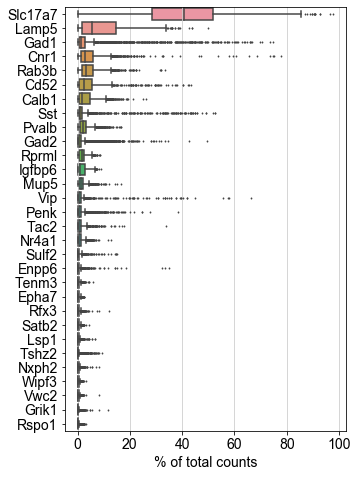

In [4]:
sc.pl.highest_expr_genes(merFISH_Areadata, n_top=30)

## Preprocessing

In [5]:
## normalization
# sc.pp.normalize_per_cell(merFISH_Areadata)
sc.pp.log1p(merFISH_Areadata) #natural log +1

In [6]:
sc.pp.highly_variable_genes(merFISH_Areadata)
# sc.pl.highly_variable_genes(merFISH_Areadata)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [7]:
df = merFISH_Areadata.var
df_sort = df.sort_values(by=['means'], ascending=False)
genes_m = df_sort.iloc[0:30].index.tolist()
# genes_v = df[df.highly_variable==True].index.tolist()

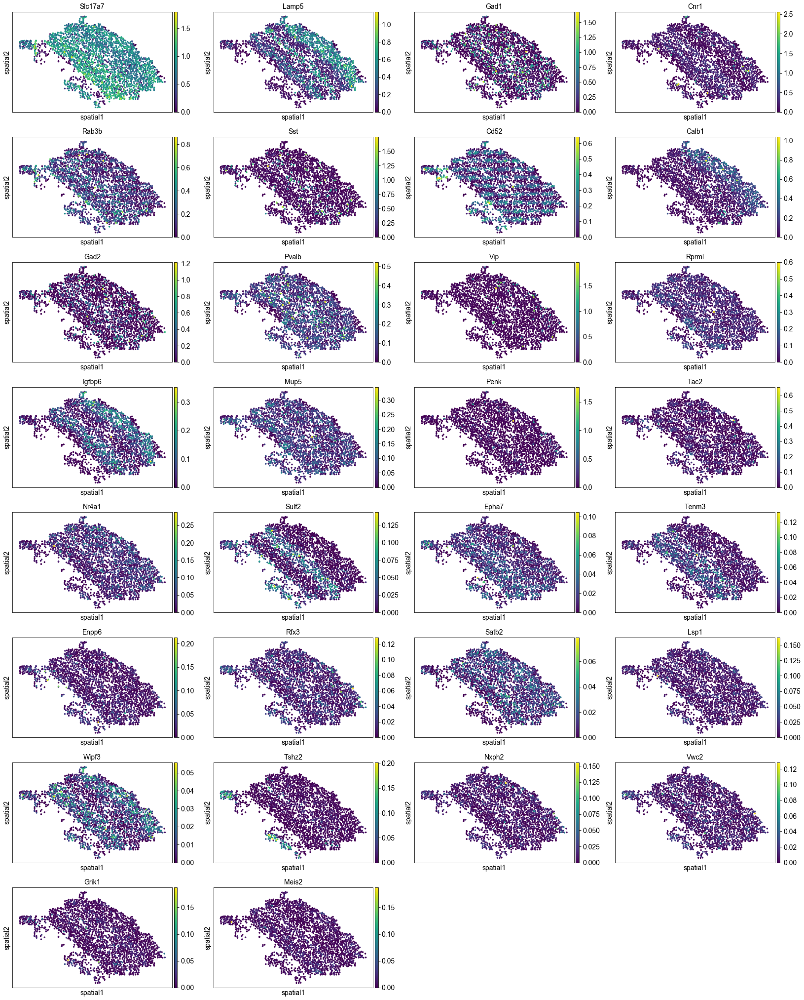

In [8]:
sc.pl.spatial(merFISH_Areadata, color=genes_m)

## Iteration 1: Initial clustering with Cd52 removed

In [9]:
## remove Cd52
merFISH_Areadata_no_Cd52=merFISH_Areadata[:,~merFISH_Areadata.var_names.isin(['Cd52'])]
merFISH_Areadata_no_Cd52

View of AnnData object with n_obs × n_vars = 2389 × 267 
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p'
    obsm: 'X_spatial'

In [10]:
adata = merFISH_Areadata_no_Cd52

computing PCA with n_comps = 50
    finished (0:00:00)


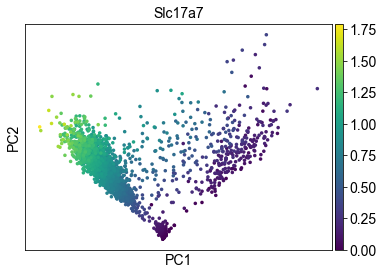

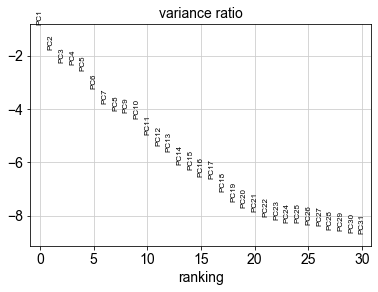

In [11]:
## PCA
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=False)
sc.pl.pca(adata, color='Slc17a7')
sc.pl.pca_variance_ratio(adata, log=True)

In [12]:
## Single batch
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)

## Multiple batches
# sce.pp.bbknn(adata,batch_key='batch',n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:01)


## Louvain clustering

In [13]:
myres = 0.5
sc.tl.louvain(adata, resolution=myres)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


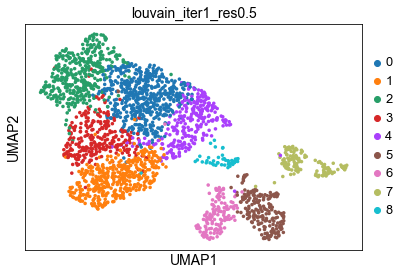

In [14]:
sc.tl.umap(adata)
sc.pl.umap(adata, color=['louvain'], title=f'louvain_iter1_res{myres}')

In [15]:
# sc.tl.tsne(adata)
# sc.pl.tsne(adata, color=['louvain'])

## Find marker genes by Wilcoxon

In [16]:
# sc.tl.rank_genes_groups(adata,'louvain', method='wilcoxon', corr_method='benjamini-hochberg') 
# sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [17]:
# sc.pl.rank_genes_groups_matrixplot(adata, n_genes=3)

In [18]:
# sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=3)

## Find marker genes by logistic regression

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


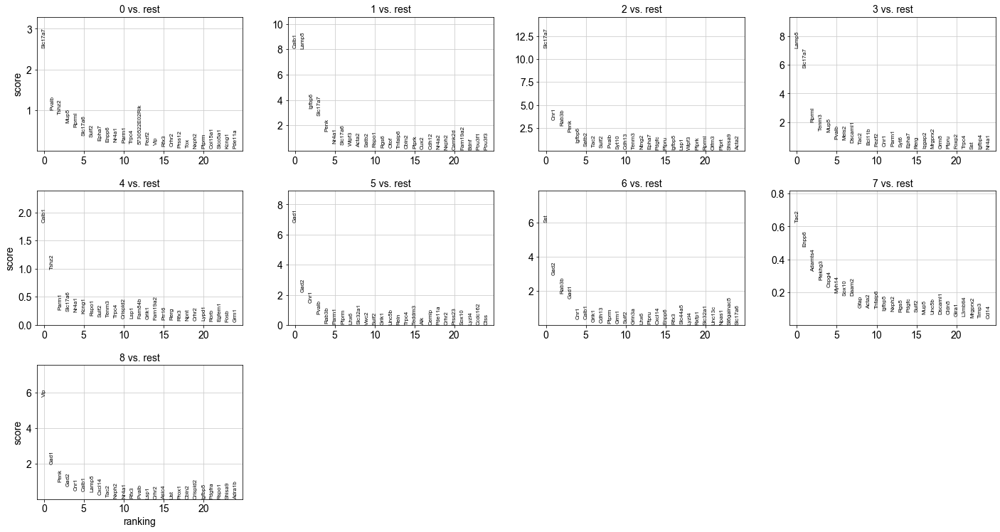

In [19]:
sc.tl.rank_genes_groups(adata, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


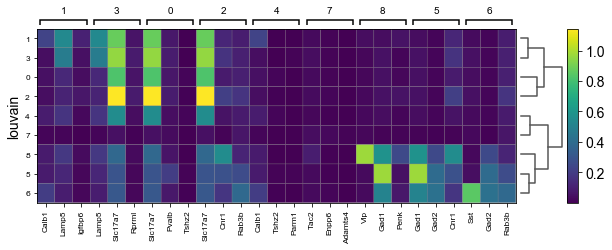

In [20]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=3)

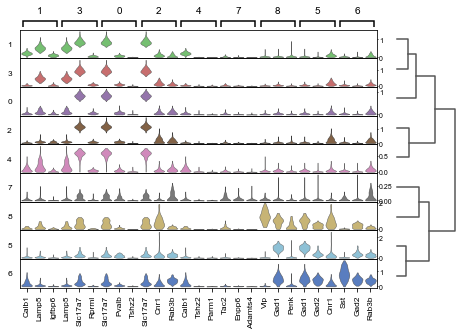

In [21]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=3)

## Cluster sizes

In [22]:
print("Cluster Sizes")
print(adata.obs['louvain'].value_counts())

Cluster Sizes
0    519
1    427
2    382
3    280
4    268
5    194
6    139
7    134
8     46
Name: louvain, dtype: int64


## Spatial plot

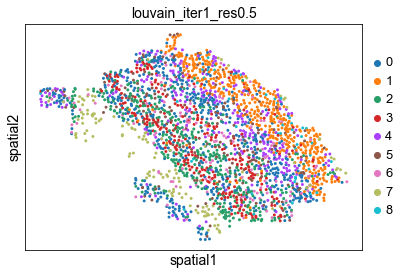

In [23]:
# plt.rcParams['figure.figsize'] = 8,8
sc.pl.spatial(adata, color = "louvain", size=35, title=f'louvain_iter1_res{myres}')

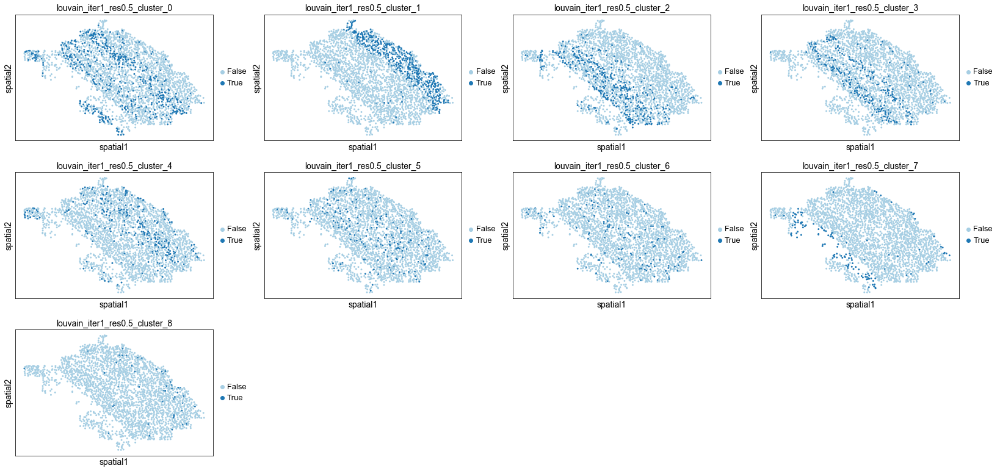

In [24]:
# plt.rcParams['figure.figsize'] = 5,5
all_cat = adata.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata.obs['louvain'] == i
    adata.obs[f'louvain_iter1_res{myres}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata, color=[f'louvain_iter1_res{myres}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=35)


In [25]:
adata

AnnData object with n_obs × n_vars = 2389 × 267 
    obs: 'louvain', 'louvain_iter1_res0.5_cluster_0', 'louvain_iter1_res0.5_cluster_1', 'louvain_iter1_res0.5_cluster_2', 'louvain_iter1_res0.5_cluster_3', 'louvain_iter1_res0.5_cluster_4', 'louvain_iter1_res0.5_cluster_5', 'louvain_iter1_res0.5_cluster_6', 'louvain_iter1_res0.5_cluster_7', 'louvain_iter1_res0.5_cluster_8'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'louvain', 'umap', 'louvain_colors', 'rank_genes_groups', 'dendrogram_louvain', 'louvain_iter1_res0.5_cluster_0_colors', 'louvain_iter1_res0.5_cluster_1_colors', 'louvain_iter1_res0.5_cluster_2_colors', 'louvain_iter1_res0.5_cluster_3_colors', 'louvain_iter1_res0.5_cluster_4_colors', 'louvain_iter1_res0.5_cluster_5_colors', 'louvain_iter1_res0.5_cluster_6_colors', 'louvain_iter1_res0.5_cluster_7_colors', 'louvain_iter1_res0.5_cluster_8_colors'
    obsm: 'X_spatial', 'X_pca', 'X_umap'
    varm: 'PCs'

## Iteration 2: Re-clustering EXC clusters with Slc17a7 removed

In [26]:
## major EXC cluster
adata_majorClEXC = adata[adata.obs['louvain'].isin(["0","1","2","3","4"])]
## remove Slc17a7
adata_majorClEXC_no_Slc17a7 = adata_majorClEXC[:, ~adata.var_names.isin(['Slc17a7'])]

computing PCA with n_comps = 50
    finished (0:00:00)


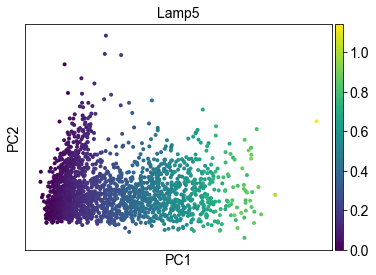

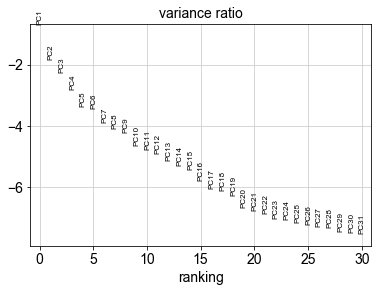

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)


In [27]:
## adata2
adata2 = adata_majorClEXC_no_Slc17a7

## PCA
sc.tl.pca(adata2, svd_solver='arpack', use_highly_variable=False)
sc.pl.pca(adata2, color='Lamp5')
sc.pl.pca_variance_ratio(adata2, log=True)

## Computing the neighborhood graph
sc.pp.neighbors(adata2, n_neighbors=10, n_pcs=30)

### Iteration 2: Louvain resolution .7

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


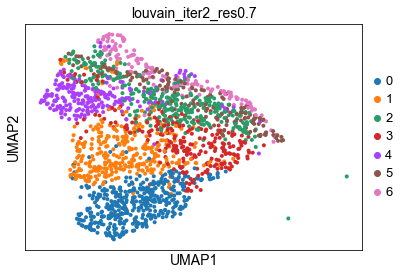

louvain_iter2_res0.7
Cluster Sizes
0    435
1    348
2    319
3    242
4    223
5    169
6    140
Name: louvain, dtype: int64
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


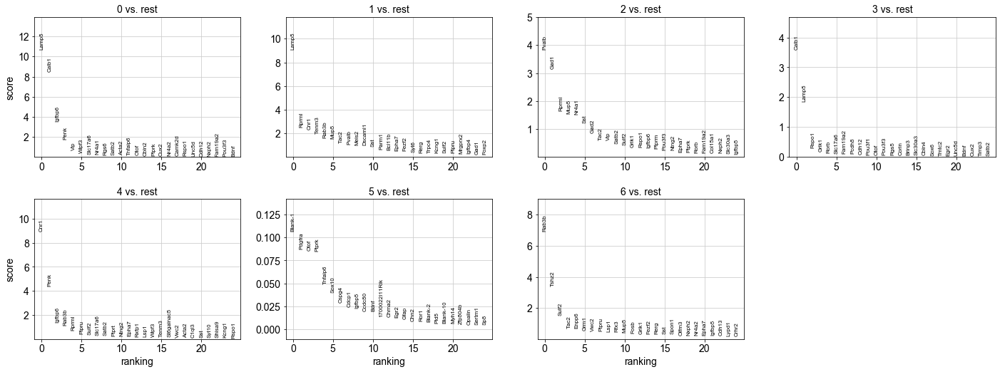

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


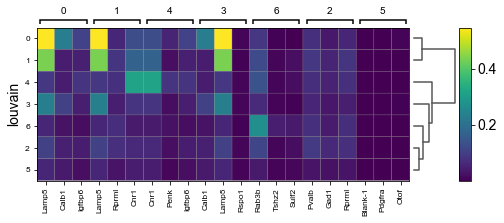

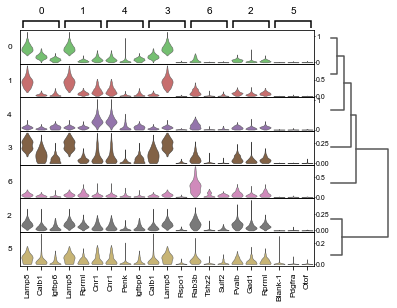

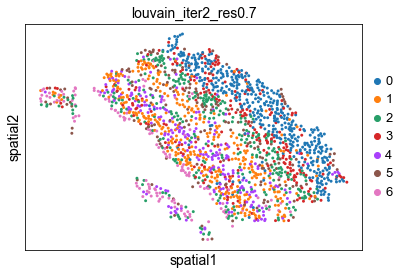

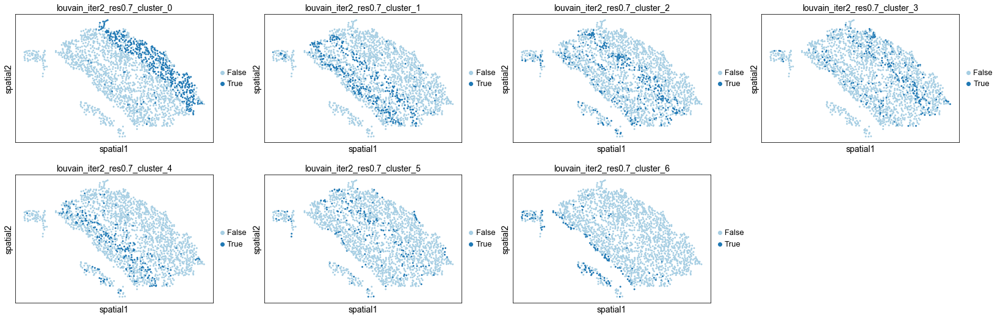

In [28]:
## Louvain
myres = 0.7
sc.tl.louvain(adata2, resolution=myres)

## Umap
mytitle = f'louvain_iter2_res{myres}'
sc.pl.umap(adata2, color=['louvain'], title=mytitle) #use the same X_umap coordinate as adata
## Tsne
# sc.pl.tsne(adata2, color=['louvain'])

## Cluster sizes
print(mytitle)
print("Cluster Sizes")
print(adata2.obs['louvain'].value_counts())

## Finding marker genes
sc.tl.rank_genes_groups(adata2, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata2, n_genes=25, sharey=False)
sc.tl.dendrogram(adata2, 'louvain')
sc.pl.rank_genes_groups_matrixplot(adata2, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata2, n_genes=3)

## Spatial plot
sc.pl.spatial(adata2, color = "louvain", size=35, title=mytitle)
## Spatial plot for each cluster
all_cat = adata2.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata2.obs['louvain'] == i
    adata2.obs[f'{mytitle}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata2, color=[f'{mytitle}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=35)

- The above cluster 5 has marker gene Blank-1.
- This Louvain clustering seems to be over-partitioned, so use a lower resolution.

### Iteration 2: Louvain resolution .6 <== FINAL

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


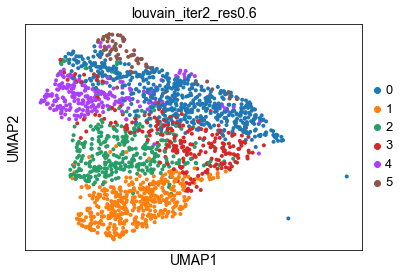

louvain_iter2_res0.6
Cluster Sizes
0    561
1    435
2    348
3    242
4    223
5     67
Name: louvain, dtype: int64
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


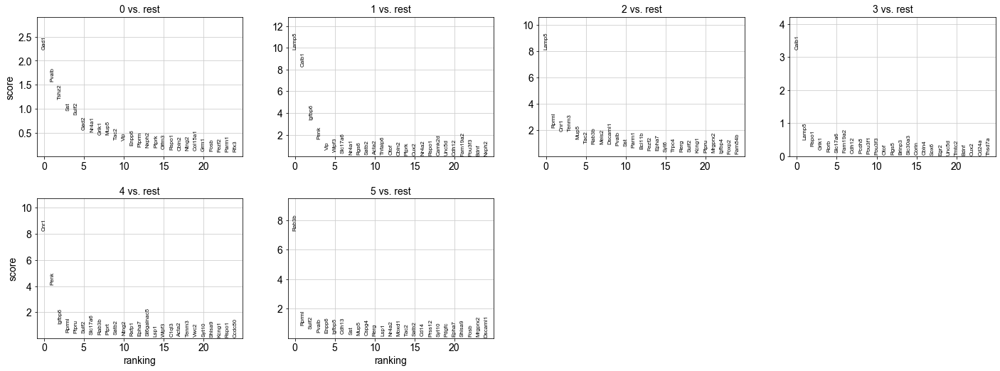

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


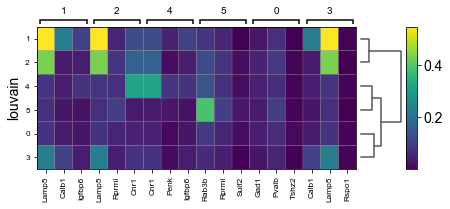

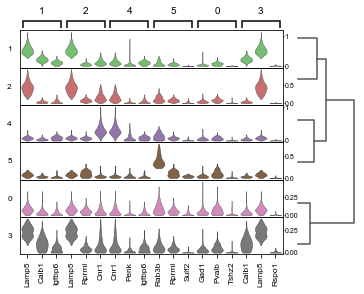

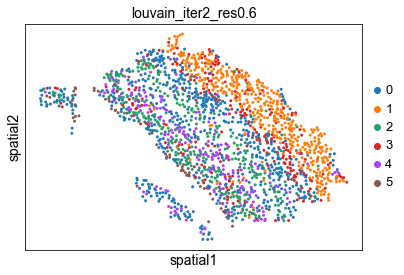

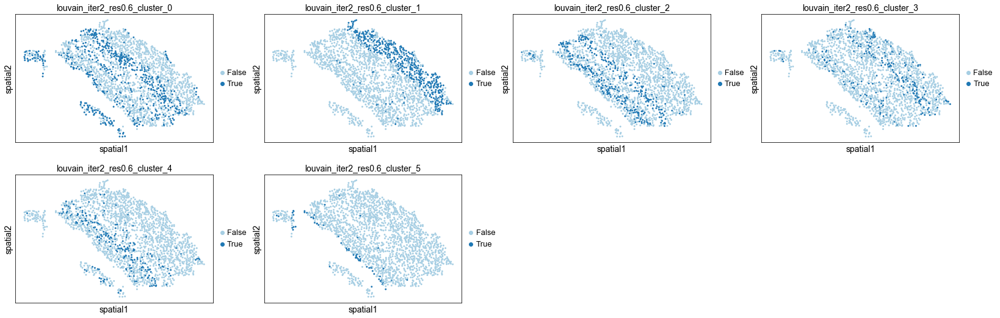

In [29]:
## Louvain
myres = 0.6
sc.tl.louvain(adata2, resolution=myres)

## Umap
mytitle = f'louvain_iter2_res{myres}'
sc.pl.umap(adata2, color=['louvain'], title=mytitle) #use the same X_umap coordinate as adata
## Tsne
# sc.pl.tsne(adata2, color=['louvain'])

## Cluster sizes
print(mytitle)
print("Cluster Sizes")
print(adata2.obs['louvain'].value_counts())

## Finding marker genes
sc.tl.rank_genes_groups(adata2, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata2, n_genes=25, sharey=False)
sc.tl.dendrogram(adata2, 'louvain')
sc.pl.rank_genes_groups_matrixplot(adata2, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata2, n_genes=3)

## Spatial plot
sc.pl.spatial(adata2, color = "louvain", size=35, title=mytitle)
## Spatial plot for each cluster
all_cat = adata2.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata2.obs['louvain'] == i
    adata2.obs[f'{mytitle}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata2, color=[f'{mytitle}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=35)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


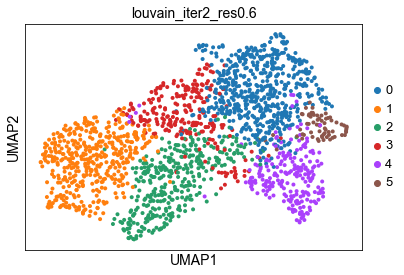

In [30]:
## Umap - NEW
adata2_new = sc.tl.umap(adata2, copy=True)
sc.pl.umap(adata2_new, color=['louvain'], title=mytitle)

- The above cluster 0 seems to be the contaminated INH cells.
- The above cluster 1,2,3,4 seem to be solid clusters, confirmed by both resolutions. (same cluster sizes)
- The above cluster 5 [to add some explaination]

## Iteration 2_filt: Re-clustering EXC clusters with Slc17a7 removed and flagged cells filtered

In [31]:
# adata2

computing PCA with n_comps = 50
    finished (0:00:00)


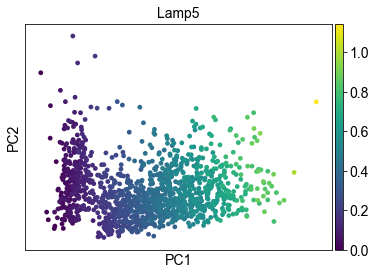

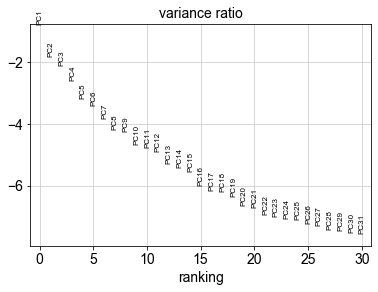

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)


In [32]:
## adata2_filt
adata2_filt = adata2[~adata2.obs['louvain'].isin(["0"])]

## PCA
sc.tl.pca(adata2_filt, svd_solver='arpack', use_highly_variable=False)
sc.pl.pca(adata2_filt, color='Lamp5')
sc.pl.pca_variance_ratio(adata2_filt, log=True)

## Computing the neighborhood graph
sc.pp.neighbors(adata2_filt, n_neighbors=10, n_pcs=30)

### Iteration 2_filt: Louvain resolution .7

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


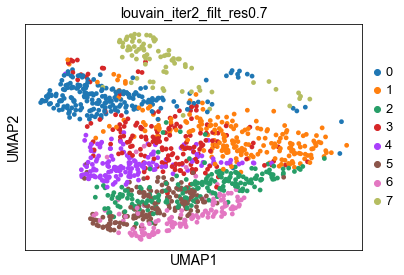

louvain_iter2_filt_res0.7
Cluster Sizes
0    212
1    208
2    199
3    176
4    161
5    154
6    123
7     82
Name: louvain, dtype: int64
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


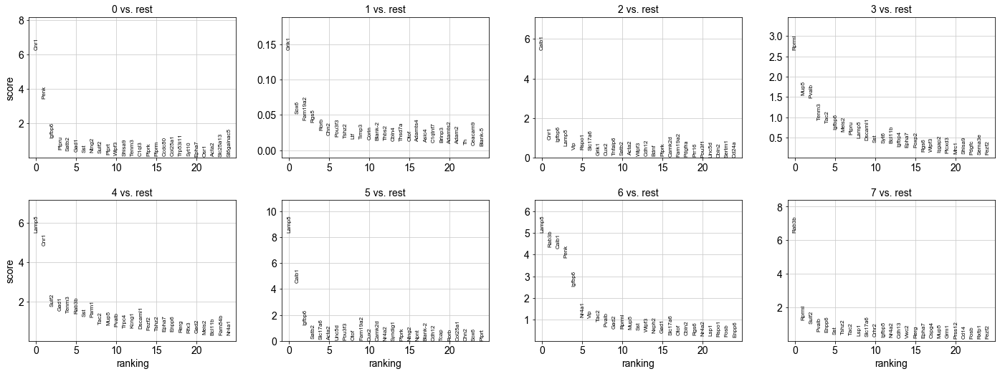

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


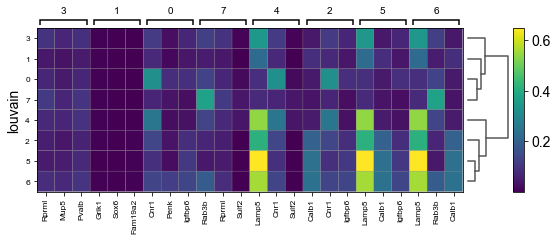

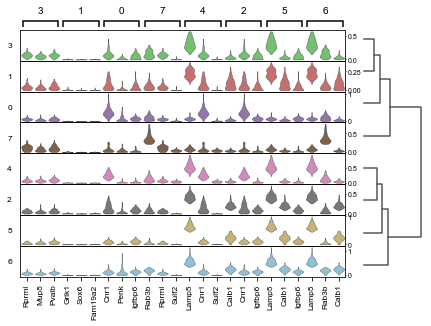

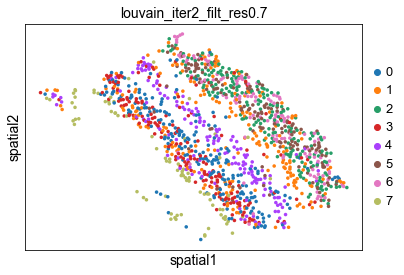

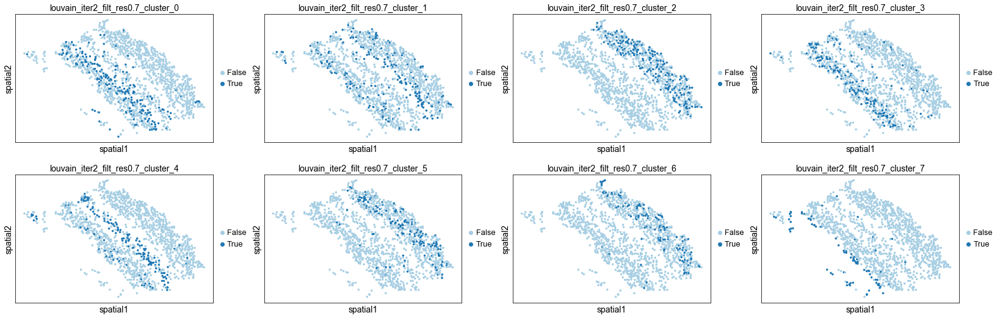

In [33]:
## Louvain
myres = 0.7
sc.tl.louvain(adata2_filt, resolution=myres)

## Umap
mytitle = f'louvain_iter2_filt_res{myres}'
sc.pl.umap(adata2_filt, color=['louvain'], title=mytitle) #use the same X_umap coordinate as adata
## Tsne
# sc.pl.tsne(adata2_filt, color=['louvain'])

## Cluster sizes
print(mytitle)
print("Cluster Sizes")
print(adata2_filt.obs['louvain'].value_counts())

## Finding marker genes
sc.tl.rank_genes_groups(adata2_filt, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata2_filt, n_genes=25, sharey=False)
sc.tl.dendrogram(adata2_filt, 'louvain')
sc.pl.rank_genes_groups_matrixplot(adata2_filt, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata2_filt, n_genes=3)

## Spatial plot
sc.pl.spatial(adata2_filt, color = "louvain", size=50, title=mytitle)
## Spatial plot for each cluster
all_cat = adata2_filt.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata2_filt.obs['louvain'] == i
    adata2_filt.obs[f'{mytitle}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata2_filt, color=[f'{mytitle}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=50)

### Iteration 2_filt: Louvain resolution .5

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


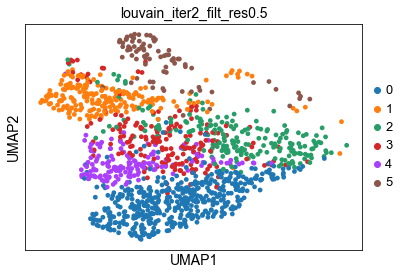

louvain_iter2_filt_res0.5
Cluster Sizes
0    476
1    212
2    208
3    176
4    161
5     82
Name: louvain, dtype: int64
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


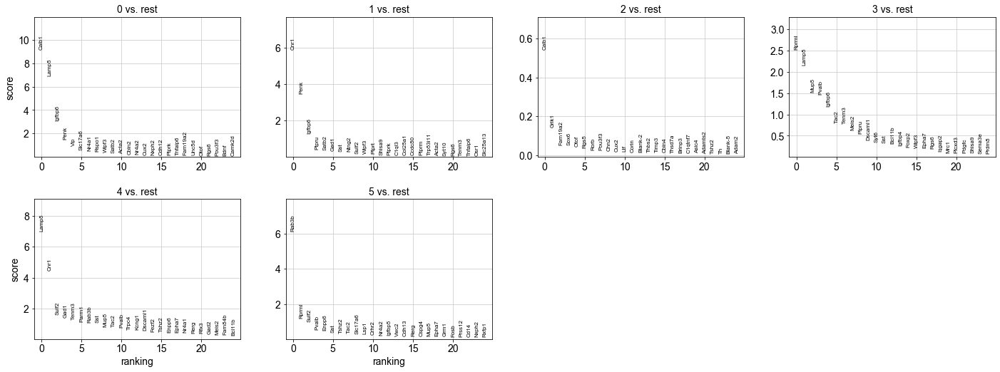

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


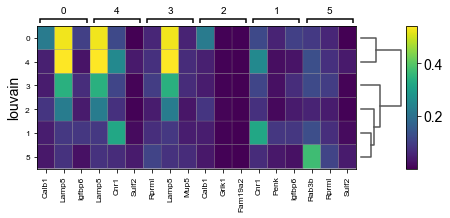

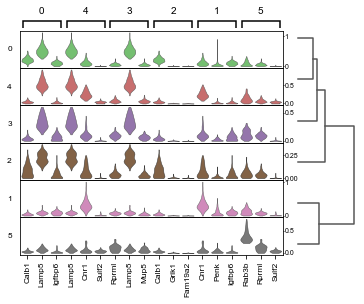

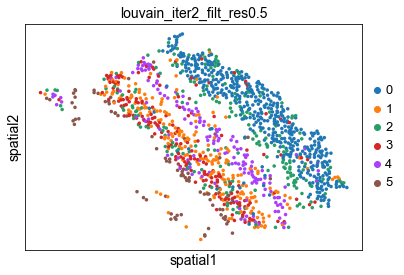

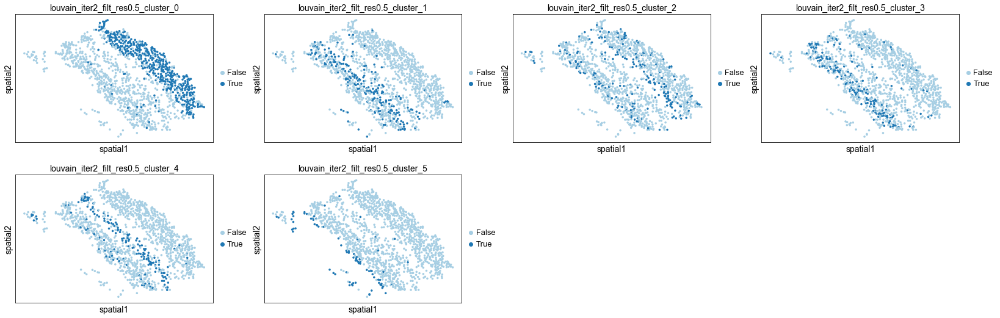

In [34]:
## Louvain
myres = 0.5
sc.tl.louvain(adata2_filt, resolution=myres)

## Umap
mytitle = f'louvain_iter2_filt_res{myres}'
sc.pl.umap(adata2_filt, color=['louvain'], title=mytitle) #use the same X_umap coordinate as adata
## Tsne
# sc.pl.tsne(adata2_filt, color=['louvain'])

## Cluster sizes
print(mytitle)
print("Cluster Sizes")
print(adata2_filt.obs['louvain'].value_counts())

## Finding marker genes
sc.tl.rank_genes_groups(adata2_filt, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata2_filt, n_genes=25, sharey=False)
sc.tl.dendrogram(adata2_filt, 'louvain')
sc.pl.rank_genes_groups_matrixplot(adata2_filt, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata2_filt, n_genes=3)

## Spatial plot
sc.pl.spatial(adata2_filt, color = "louvain", size=50, title=mytitle)
## Spatial plot for each cluster
all_cat = adata2_filt.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata2_filt.obs['louvain'] == i
    adata2_filt.obs[f'{mytitle}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata2_filt, color=[f'{mytitle}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=50)

Anyways, it seems hard to cluster excitatory cells with a good UMAP seperation. **We will just stick with the cluster labels from iteration 2 with Louvain resolution 0.6.**

## Iteration 3: Re-clustering INH & GLIA clusters with Gad1 removed

In [35]:
## major cluster
adata_majorClINH = adata[adata.obs['louvain'].isin(["5","6","7","8"])]
## remove Slc17a7
adata_majorClINH_no_Gad1 = adata_majorClINH[:, ~adata.var_names.isin(['Gad1'])]

computing PCA with n_comps = 50
    finished (0:00:00)


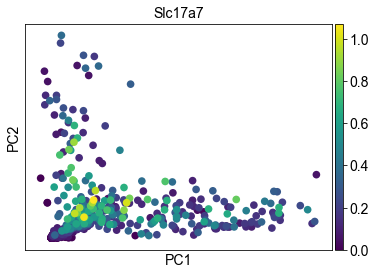

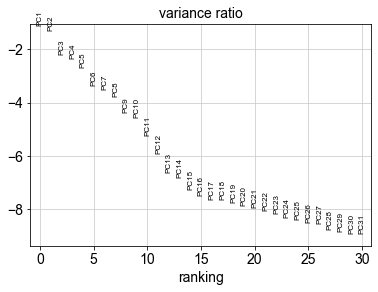

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)


In [36]:
## adata3
adata3 = adata_majorClINH_no_Gad1

## PCA
sc.tl.pca(adata3, svd_solver='arpack', use_highly_variable=False)
sc.pl.pca(adata3, color='Slc17a7')
sc.pl.pca_variance_ratio(adata3, log=True)

## Computing the neighborhood graph
sc.pp.neighbors(adata3, n_neighbors=10, n_pcs=30)

### Iteration 3: Louvain resolution .7

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


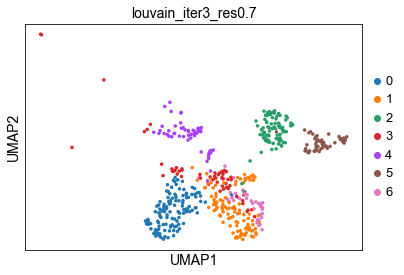

louvain_iter3_res0.7
Cluster Sizes
0    126
1    104
2     83
3     57
4     55
5     52
6     36
Name: louvain, dtype: int64
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


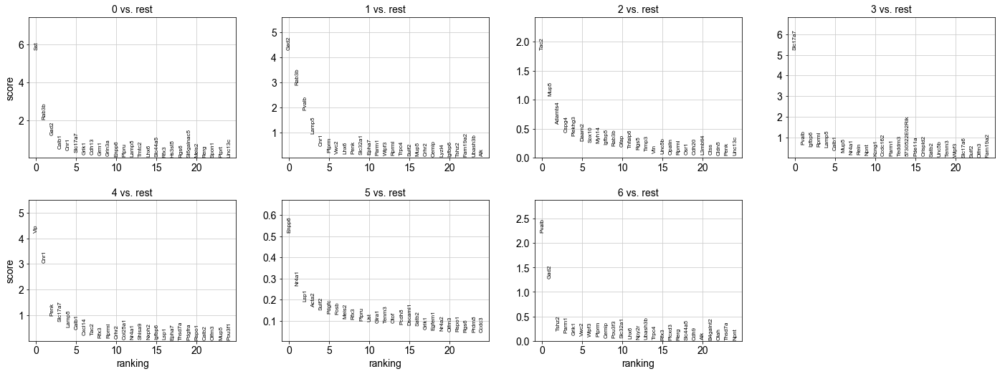

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


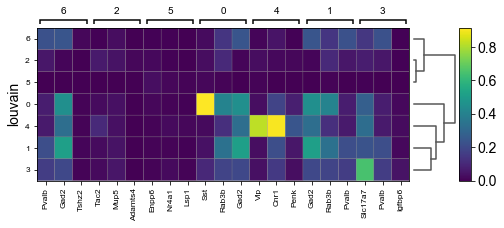

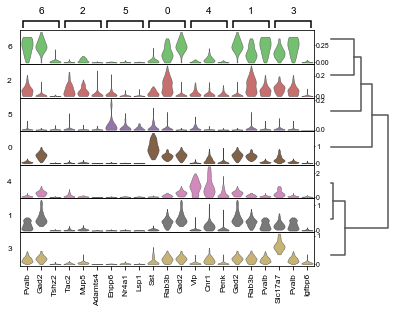

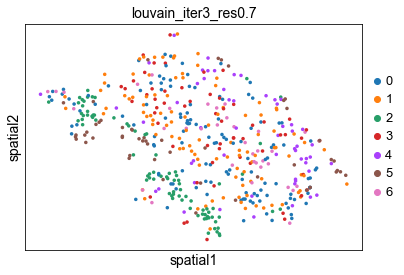

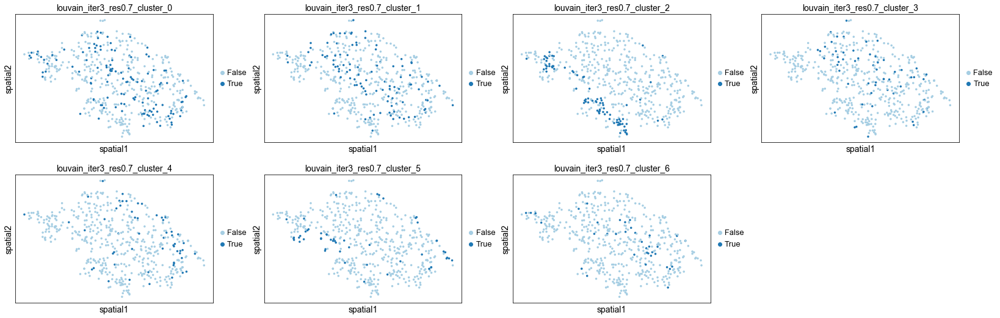

In [37]:
## Louvain
myres = 0.7
sc.tl.louvain(adata3, resolution=myres)

## Umap
mytitle = f'louvain_iter3_res{myres}'
sc.pl.umap(adata3, color=['louvain'], size=50, title=mytitle) #use the same X_umap coordinate as adata
## Tsne
# sc.pl.tsne(adata3, color=['louvain'])

## Cluster sizes
print(mytitle)
print("Cluster Sizes")
print(adata3.obs['louvain'].value_counts())

## Finding marker genes
sc.tl.rank_genes_groups(adata3, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata3, n_genes=25, sharey=False)
sc.tl.dendrogram(adata3, 'louvain')
sc.pl.rank_genes_groups_matrixplot(adata3, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata3, n_genes=3)

## Spatial plot
sc.pl.spatial(adata3, color = "louvain", size=50, title=mytitle)
## Spatial plot for each cluster
all_cat = adata3.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata3.obs['louvain'] == i
    adata3.obs[f'{mytitle}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata3, color=[f'{mytitle}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=50)

- The above cluster 3 has marker gene Slc17a7, an EXC marker.
- Try another resolution to confirm.

### Iteration 3: Louvain resolution .6

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


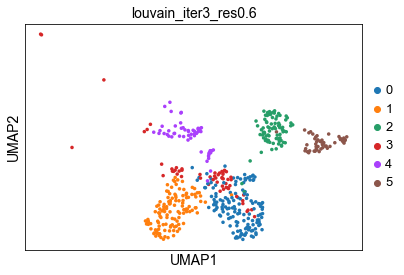

louvain_iter3_res0.6
Cluster Sizes
0    140
1    126
2     83
3     57
4     55
5     52
Name: louvain, dtype: int64
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


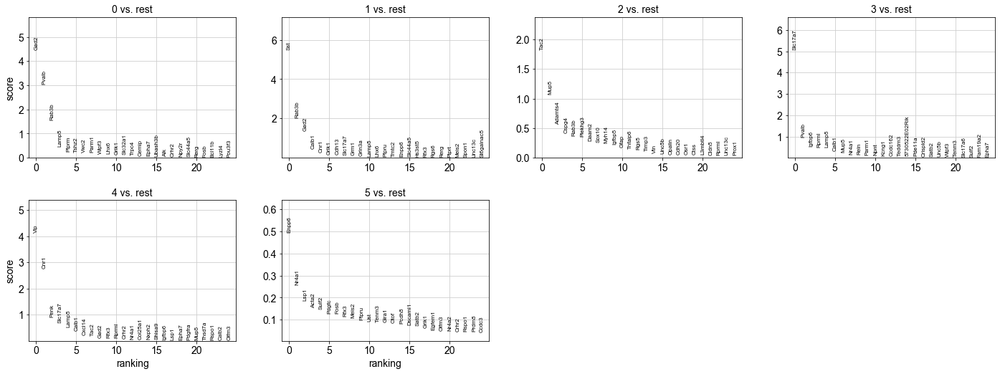

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


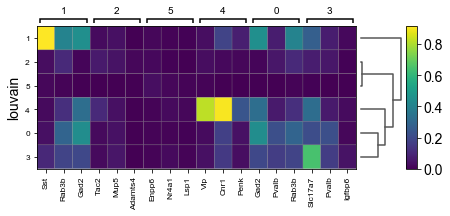

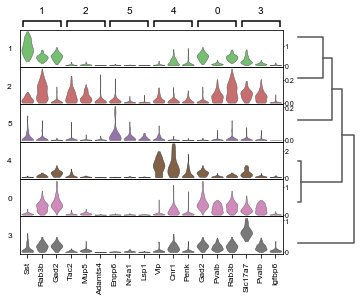

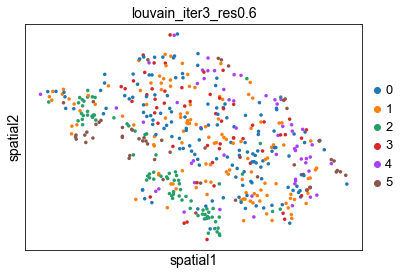

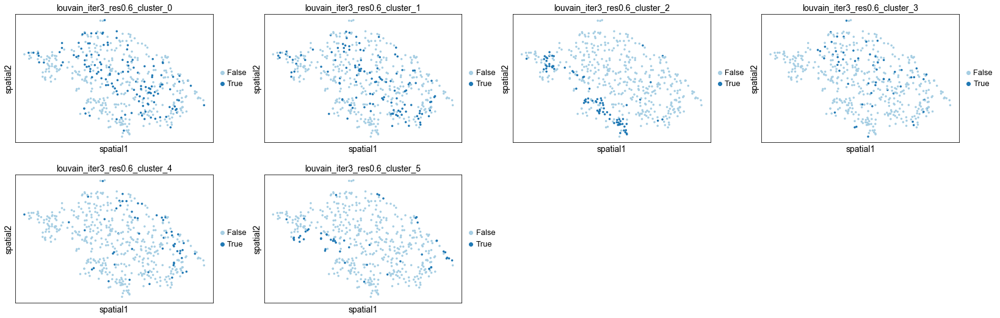

In [38]:
## Louvain
myres = 0.6
sc.tl.louvain(adata3, resolution=myres)

## Umap
mytitle = f'louvain_iter3_res{myres}'
sc.pl.umap(adata3, color=['louvain'], size=50, title=mytitle) #use the same X_umap coordinate as adata
## Tsne
# sc.pl.tsne(adata3, color=['louvain'])

## Cluster sizes
print(mytitle)
print("Cluster Sizes")
print(adata3.obs['louvain'].value_counts())

## Finding marker genes
sc.tl.rank_genes_groups(adata3, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata3, n_genes=25, sharey=False)
sc.tl.dendrogram(adata3, 'louvain')
sc.pl.rank_genes_groups_matrixplot(adata3, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata3, n_genes=3)

## Spatial plot
sc.pl.spatial(adata3, color = "louvain", size=50, title=mytitle)
## Spatial plot for each cluster
all_cat = adata3.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata3.obs['louvain'] == i
    adata3.obs[f'{mytitle}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata3, color=[f'{mytitle}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=50)

- The above cluster 3 is confirmed to be the contaminated EXC cells.
- The above cluster 1,2,4,5 seem to be solid clusters, confirmed by both resolutions. (same cluster sizes)
- The above cluster 0 seems to be under-partitions. Use the res0.7 labels for this cluster.

## Iteration 3_filt: Re-clustering INH & GLIA clusters with Gad1 removed and flagged cells filtered

In [39]:
# adata3

computing PCA with n_comps = 50
    finished (0:00:00)


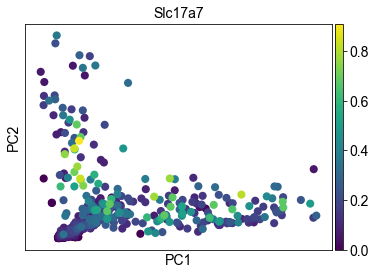

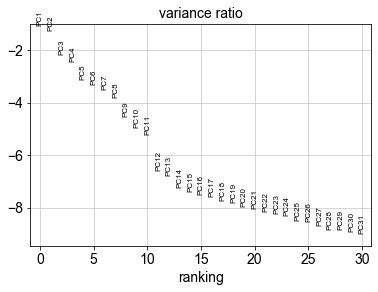

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)


In [40]:
## adata3_filt
adata3_filt = adata3[~adata3.obs['louvain'].isin(["3"])]

## PCA
sc.tl.pca(adata3_filt, svd_solver='arpack', use_highly_variable=False)
sc.pl.pca(adata3_filt, color='Slc17a7')
sc.pl.pca_variance_ratio(adata3_filt, log=True)

## Computing the neighborhood graph
sc.pp.neighbors(adata3_filt, n_neighbors=10, n_pcs=30)

### Iteration 3_filt: Louvain resolution .6

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


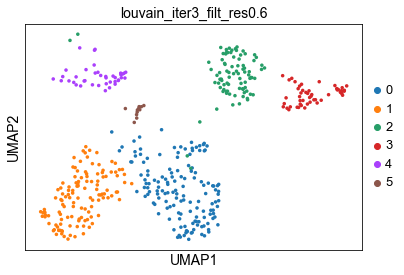

louvain_iter3_filt_res0.6
Cluster Sizes
0    143
1    125
2     86
3     51
4     40
5     11
Name: louvain, dtype: int64
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


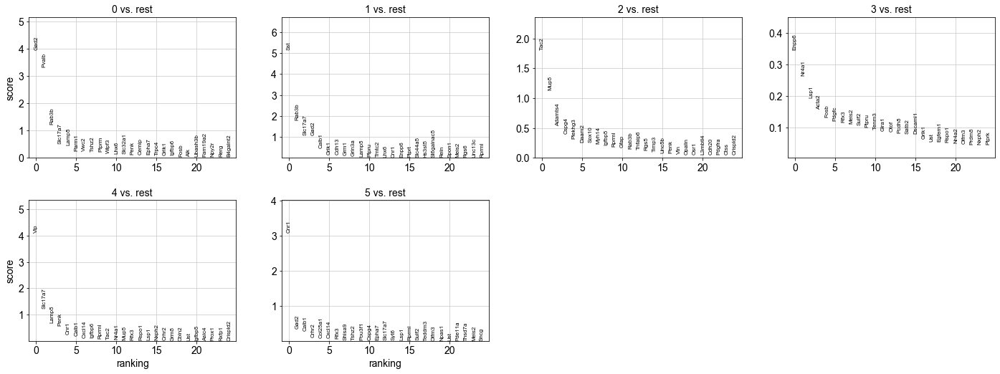

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


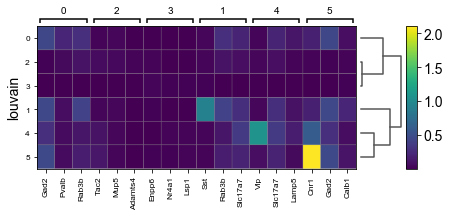

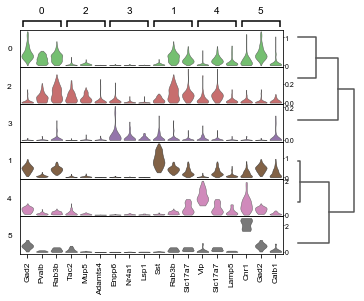

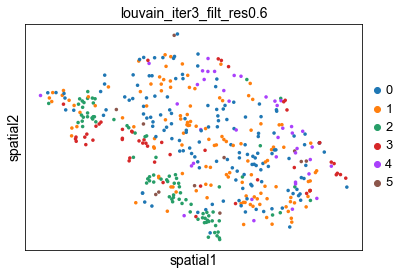

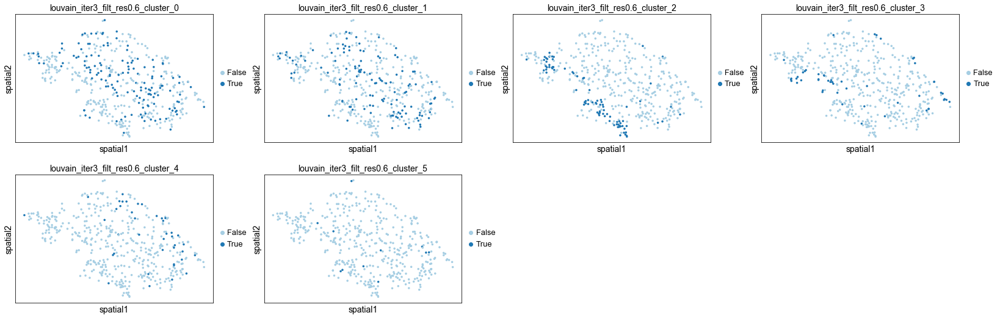

In [41]:
## Louvain
myres = 0.6
sc.tl.louvain(adata3_filt, resolution=myres)

## Umap
mytitle = f'louvain_iter3_filt_res{myres}'
sc.pl.umap(adata3_filt, color=['louvain'], size=50, title=mytitle) #use the same X_umap coordinate as adata
## Tsne
# sc.pl.tsne(adata3_filt, color=['louvain'])

## Cluster sizes
print(mytitle)
print("Cluster Sizes")
print(adata3_filt.obs['louvain'].value_counts())

## Finding marker genes
sc.tl.rank_genes_groups(adata3_filt, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata3_filt, n_genes=25, sharey=False)
sc.tl.dendrogram(adata3_filt, 'louvain')
sc.pl.rank_genes_groups_matrixplot(adata3_filt, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata3_filt, n_genes=3)

## Spatial plot
sc.pl.spatial(adata3_filt, color = "louvain", size=50, title=mytitle)
## Spatial plot for each cluster
all_cat = adata3_filt.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata3_filt.obs['louvain'] == i
    adata3_filt.obs[f'{mytitle}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata3_filt, color=[f'{mytitle}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=50)

### Iteration 3_filt: Louvain resolution .7 <== FINAL

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


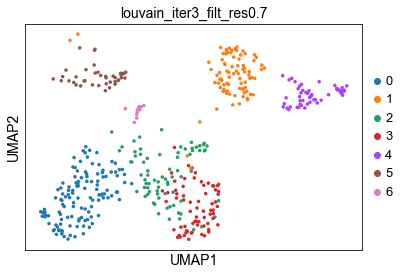

louvain_iter3_filt_res0.7
Cluster Sizes
0    125
1     86
2     75
3     68
4     51
5     40
6     11
Name: louvain, dtype: int64
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


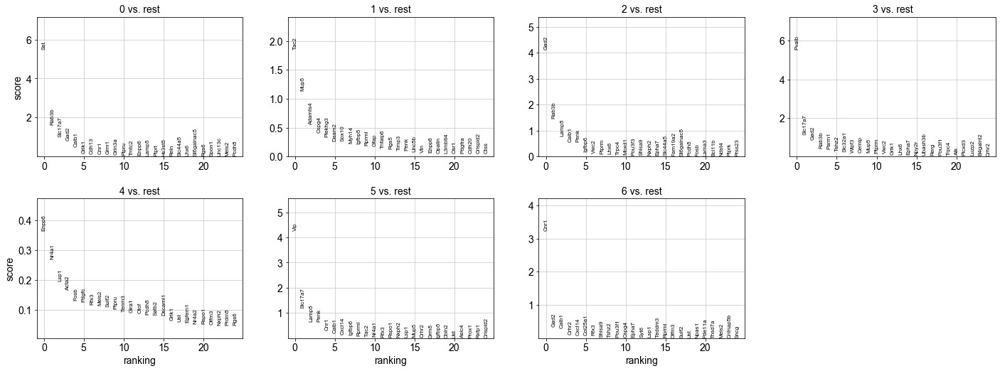

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


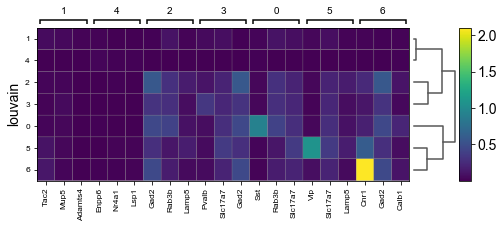

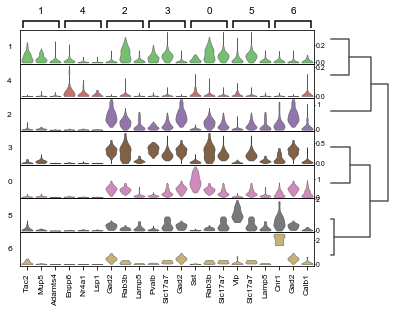

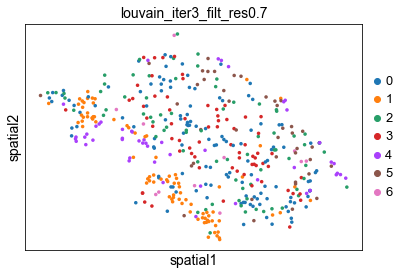

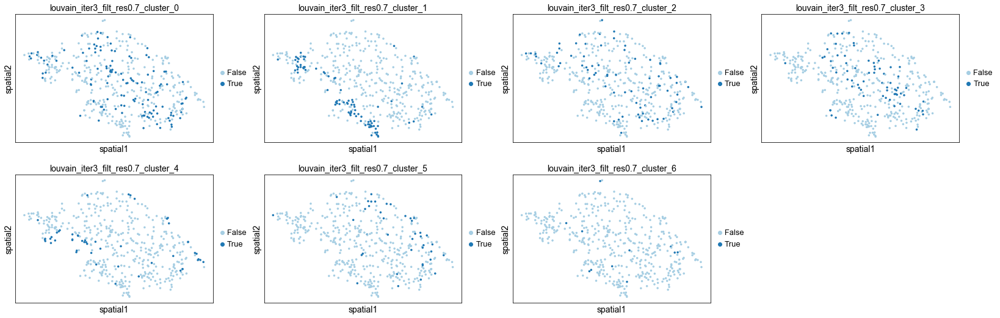

In [42]:
## Louvain
myres = 0.7
sc.tl.louvain(adata3_filt, resolution=myres)

## Umap
mytitle = f'louvain_iter3_filt_res{myres}'
sc.pl.umap(adata3_filt, color=['louvain'], size=50, title=mytitle) #use the same X_umap coordinate as adata
## Tsne
# sc.pl.tsne(adata3_filt, color=['louvain'])

## Cluster sizes
print(mytitle)
print("Cluster Sizes")
print(adata3_filt.obs['louvain'].value_counts())

## Finding marker genes
sc.tl.rank_genes_groups(adata3_filt, 'louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata3_filt, n_genes=25, sharey=False)
sc.tl.dendrogram(adata3_filt, 'louvain')
sc.pl.rank_genes_groups_matrixplot(adata3_filt, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata3_filt, n_genes=3)

## Spatial plot
sc.pl.spatial(adata3_filt, color = "louvain", size=50, title=mytitle)
## Spatial plot for each cluster
all_cat = adata3_filt.obs['louvain'].cat.categories
for i in all_cat:
    dummy = adata3_filt.obs['louvain'] == i
    adata3_filt.obs[f'{mytitle}_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata3_filt, color=[f'{mytitle}_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=50)

**Finally, decide to work with cluster labels from iteration 3_filt (57 "bad" cells removed) with Louvain resolution 0.7.**

## Final cluster labels for all

In [43]:
## final cluster labels
label2 = adata2.obs['louvain'] #EXC labels from iteration 2
label3 = adata3_filt.obs['louvain'].cat.rename_categories([6,7,8,9,10,11,12]) #INH & GLIA labels from iteration 3_filt
final_louvain = label2.append(label3) #append final louvain labels from above iterations
final_louvain

1        0
2        0
3        2
4        0
5        0
        ..
2390    10
2392    10
2395    10
2397    10
2398     8
Name: louvain, Length: 2332, dtype: object

In [44]:
## final adata
adata_final = adata[final_louvain.index,]
adata_final.obs['final_louvain'] = final_louvain
adata_final #final cluster labels and original UMPA embedding

Trying to set attribute `.obs` of view, making a copy.


AnnData object with n_obs × n_vars = 2332 × 267 
    obs: 'louvain', 'louvain_iter1_res0.5_cluster_0', 'louvain_iter1_res0.5_cluster_1', 'louvain_iter1_res0.5_cluster_2', 'louvain_iter1_res0.5_cluster_3', 'louvain_iter1_res0.5_cluster_4', 'louvain_iter1_res0.5_cluster_5', 'louvain_iter1_res0.5_cluster_6', 'louvain_iter1_res0.5_cluster_7', 'louvain_iter1_res0.5_cluster_8', 'final_louvain'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'pca', 'neighbors', 'louvain', 'umap', 'louvain_colors', 'rank_genes_groups', 'dendrogram_louvain', 'louvain_iter1_res0.5_cluster_0_colors', 'louvain_iter1_res0.5_cluster_1_colors', 'louvain_iter1_res0.5_cluster_2_colors', 'louvain_iter1_res0.5_cluster_3_colors', 'louvain_iter1_res0.5_cluster_4_colors', 'louvain_iter1_res0.5_cluster_5_colors', 'louvain_iter1_res0.5_cluster_6_colors', 'louvain_iter1_res0.5_cluster_7_colors', 'louvain_iter1_res0.5_cluster_8_colors'
    obsm: 'X_spatial', 'X_pca', 'X_umap'
    varm: '

... storing 'final_louvain' as categorical


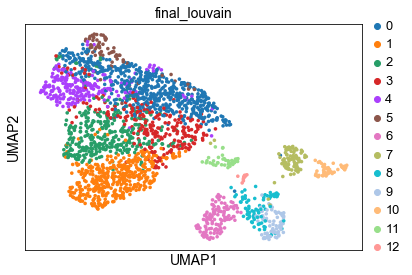

In [45]:
## final UMAP
sc.pl.umap(adata_final, color='final_louvain')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:00)


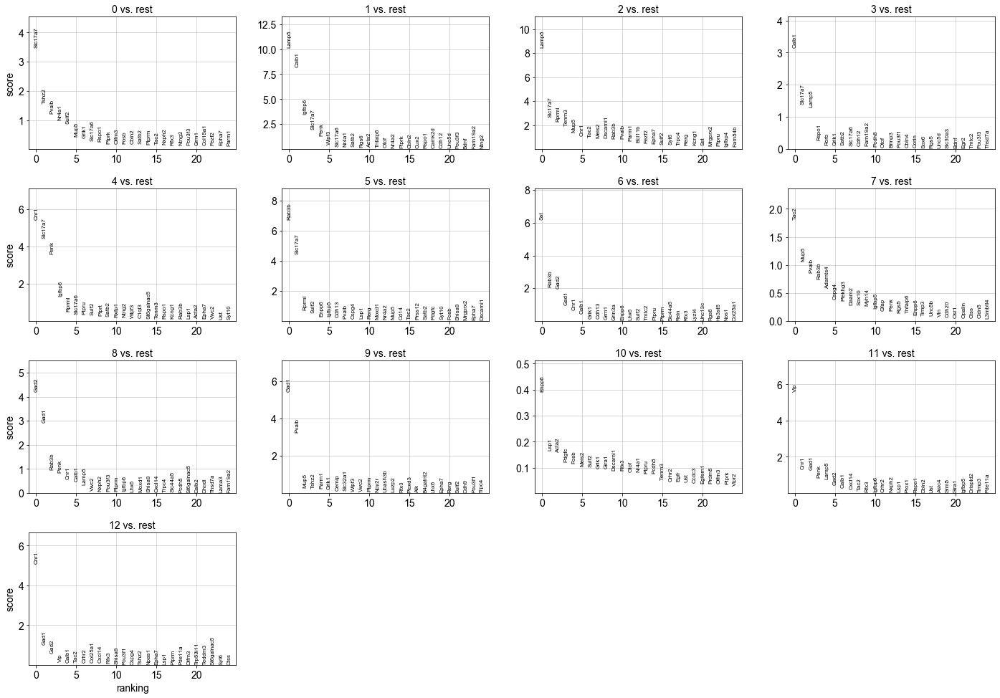

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_final_louvain']`


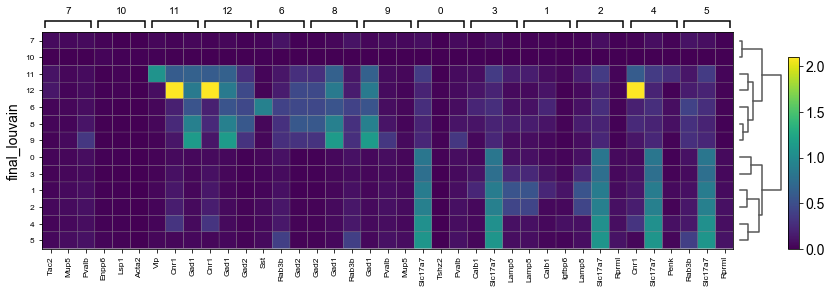

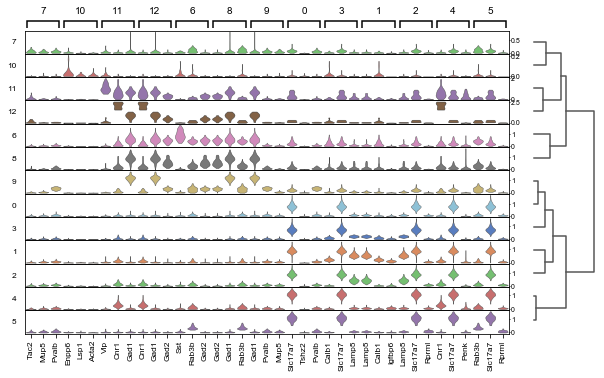

In [46]:
## Finding marker genes
sc.tl.rank_genes_groups(adata_final, 'final_louvain', use_raw=True, method='logreg')
sc.pl.rank_genes_groups(adata_final, n_genes=25, sharey=False)
sc.tl.dendrogram(adata_final, 'final_louvain')
sc.pl.rank_genes_groups_matrixplot(adata_final, n_genes=3)
sc.pl.rank_genes_groups_stacked_violin(adata_final, n_genes=3)

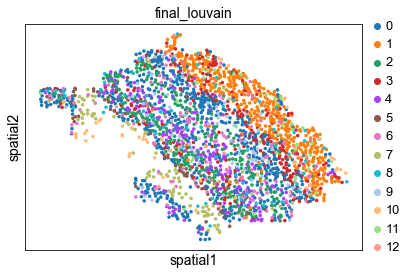

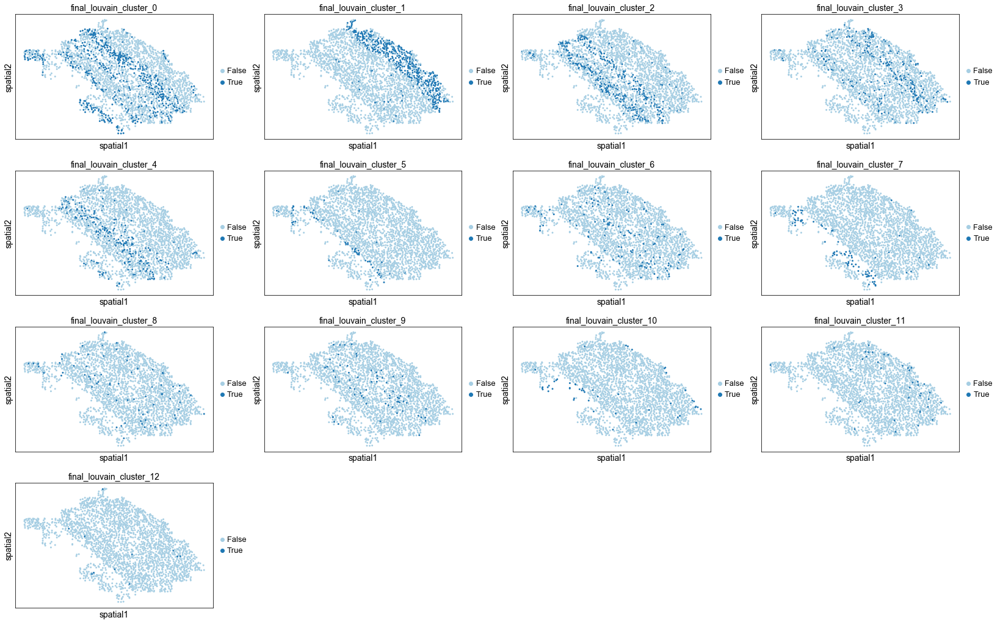

In [47]:
## Spatial plot
sc.pl.spatial(adata_final, color = "final_louvain", size=50)
## Spatial plot for each cluster
all_cat = adata_final.obs['final_louvain'].cat.categories
for i in all_cat:
    dummy = adata_final.obs['final_louvain'] == i
    adata_final.obs[f'final_louvain_cluster_{i}'] = dummy.astype('category')
sc.pl.spatial(adata_final, color=['final_louvain_cluster_' + str(i) for i in all_cat], 
              palette=sb.color_palette('Paired'), size=35)

In [48]:
## Cluster sizes
print('final_louvain')
print("Cluster Sizes")
print(adata_final.obs['final_louvain'].value_counts())

final_louvain
Cluster Sizes
0     561
1     435
2     348
3     242
4     223
6     125
7      86
8      75
9      68
5      67
10     51
11     40
12     11
Name: final_louvain, dtype: int64


## Save final cluster labels

In [49]:
## save cluster labels
adata_final.obs['final_louvain'].to_csv("Allen_MERFISH_iterLouvain_labels.csv")